In [1]:
import pandas as pd
import numpy as np
import os
import json
import pandas_datareader.data as web   # my local kernel Python 3.10.7 
import matplotlib.pyplot as plt  # unavailable?  do: 1. pip uninstall matplotlib # 2. python3 -m pip install matplotlib
%matplotlib inline
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
import datetime
import io
pd.set_option('display.max_columns', None)
import warnings
import seaborn as sns
import scipy
from scipy import stats
warnings.filterwarnings("ignore")
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
import talib as ta


In [2]:
def from_Tick(csvFile, interval, chart):
    tit = str(csvFile).replace('C:\BidAskRepo\\', '').replace('older_repo2022\\', '').replace('Globex_', '').replace('.csv','').strip()
    # tit = str(csvFile).replace('C:\\BidAskRepo\\', '').replace(' Globex_', '_').replace('.csv','')
    periodGlobal = interval
    columns = ['DateTime', 'Vol', 'BidAsk', 'Bid', 'Ask', 'Price']
    mapping = {'AtBid': -1, 'AtAsk': 1, 'BelowBid': -2, 'AboveAsk': 2, 'BetweenBidAsk':0 }  
    l = pd.read_csv(csvFile, names = columns, index_col='DateTime', parse_dates= True)  
    l = l.replace({'BidAsk': mapping})
    l['Scaled'] = stats.zscore(l.Price)
    print('Shape: ', l.shape)
    del l['Ask']
    del l['Bid']
    if chart:
        ti = str(l.index[0])[0:10]
        # print('ti is: ', ti)  
        p1 = ti + ' 06:00:00'
        p2 = ti + ' 16:30:00'
        p11 = ti + ' 09:00:00'
        p12 = ti + ' 10:00:00'
        # print('p1, p2 are: ', p1, p2)
        l.loc[p1:p2].plot(y='Scaled', figsize=(16,4)) 
        ti = str(l.index[0])[0:10]
        plt.title(tit)
        plt.axhline(y= l.loc[p11 : p12]['Scaled'].max(), xmin = 0.32, xmax = 0.92, color = 'blue', linestyle = 'dashed', label="Open-High", alpha=0.3)
        plt.axhline(y= l.loc[p11 : p12]['Scaled'].min(), xmin = 0.32, xmax = 0.92, color = 'red', linestyle = 'dashed', label="Open-Low", alpha=0.3)
        plt.axhline(y= 0, xmin = 0.99, xmax = 0.001, color = 'black', linestyle = 'dashed', label="0", linewidth= 1)
        plt.axvline(x=  ti + ' 07:00:00')
        plt.axvline(x=  ti + ' 09:30:00', ymax = 1, linewidth= 1.5, color='red', alpha=0.7)
        plt.axvline(x=  ti + ' 10:00:00', ymax = 1, linewidth= 1.5, color='red', alpha=0.7)
        plt.axvline(x=  ti + ' 09:45:00', ymax = 1, linewidth= 45, color='blue', alpha=0.2)
        plt.axvline(x=  ti + ' 11:00:00', ymax = 1, linewidth= 1.5, color='b', alpha=0.1)
        plt.axvline(x=  ti + ' 11:10:00', ymax = 1, linewidth= 1.5, color='b', alpha=0.1)
        plt.axvline(x=  ti + ' 11:20:00', ymax = 1, linewidth= 1.5, color='b', alpha=0.1)
        plt.axvline(x=  ti + ' 11:30:00', ymax = 1, linewidth= 1.5, color='b', alpha=0.1)
        plt.axvline(x=  ti + ' 12:00:00', ymax = 1, linewidth= 1.5, color='b', alpha=0.1)
        plt.axvline(x=  ti + ' 13:00:00', ymax = 1, linewidth= 1.5, color='b', alpha=0.1)
        plt.axvline(x=  ti + ' 14:00:00', ymax = 1, linewidth= 1.5, color='b', alpha=0.1)
        plt.axvline(x=  ti + ' 15:00:00', ymax = 1, linewidth= 1.5, color='b', alpha=0.1)
        plt.axvline(x=  ti + ' 16:00:00', color= 'red')
        plt.grid()
    return l

- On 1 chart

Shape:  (1596480, 6)


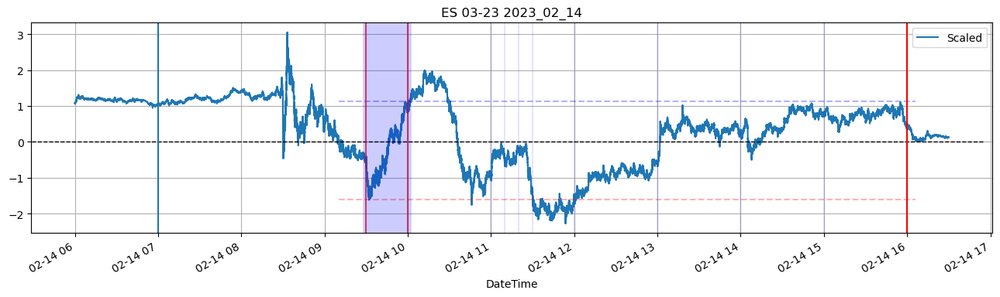

In [3]:
df = from_Tick("C:\BidAskRepo\ES 03-23 Globex_2023_02_14.csv", '1Min', True)

- Make an All repo list, consisting from 

In [14]:
#----------get directory of csv and make list   we need:  # to_df_OHLC('C:\\BidAskRepo\\ES 03-23 Globex_2022_12_06.csv' , '1Min', True)  
repo = []
import os
path = "C:\BidAskRepo"
dd = os.listdir(path)
dd.sort()
# print('Length is : ', len(dd))  #     95      180
#----------deal with string of file ------------

for i in range(len(dd)):    
    from pathlib import Path
    data_folder = Path("C:\BidAskRepo") 
    file_to_open = data_folder/str(dd[i])
    repo.append(file_to_open.__str__())
   
print(len(repo)) # 274


274


In [ ]:
# check string
for i in range(0, 274):   
    print(repo[i])         
    x = repo[i].replace('C:\BidAskRepo\\', '').replace('older_repo2022\\', '').replace('Globex_', '').replace('.csv','').strip()
    print(x)


In [23]:
for i in range(0,len(repo)):
    print(repo[i])

C:\BidAskRepo\ES 03-23 Globex_2022_12_05.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_06.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_08.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_09.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_12.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_13.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_14.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_15.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_16.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_19.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_20.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_21.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_22.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_27.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_28.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_29.csv
C:\BidAskRepo\ES 03-23 Globex_2022_12_30.csv
C:\BidAskRepo\ES 03-23 Globex_2023_01_02.csv
C:\BidAskRepo\ES 03-23 Globex_2023_01_03.csv
C:\BidAskRepo\ES 03-23 Globex_2023_01_04.csv
C:\BidAskRepo\ES 03-23 Globex_2023_01_05.csv
C:\BidAskRepo\ES 03-23 Globex_2023_01_06.csv
C:\BidAskR

x is:  ES 03-23 2022_12_05
Shape:  (8846, 6)


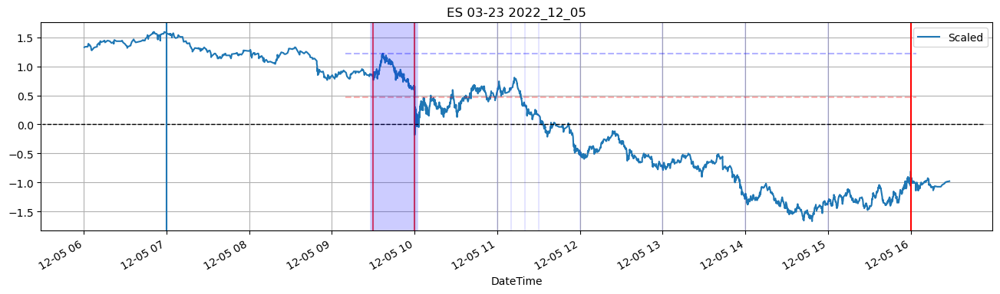

In [16]:
#  Loop through repo of 274 charts 
var_holder = {}               
# for i in range(0, len(repo)): 
for i in range(0, 1):        
    x = repo[i].replace('C:\BidAskRepo\\', '').replace('Globex_', '').replace('.csv','').strip()
    var_holder[x] = x
    print('x is: ', x)
    var_holder[x] = from_Tick(repo[i], '1S', True)
    var_holder[x].to_csv('C:\\Repo1\\' + x + '.csv')    

Shape:  (18039, 6)
Shape:  (96181, 6)
Shape:  (667359, 6)
Shape:  (742797, 6)
Shape:  (1599378, 6)
Shape:  (1226865, 6)
Shape:  (1381927, 6)
Shape:  (1215809, 6)
Shape:  (911636, 6)
Shape:  (981836, 6)
Shape:  (878075, 6)
Shape:  (1158479, 6)
Shape:  (679201, 6)
Shape:  (823860, 6)
Shape:  (685620, 6)
Shape:  (823269, 6)
Shape:  (74789, 6)
Shape:  (1154342, 6)
Shape:  (1316534, 6)
Shape:  (1098619, 6)
Shape:  (1254069, 6)
Shape:  (1053263, 6)
Shape:  (1028608, 6)
Shape:  (815654, 6)
Shape:  (1441826, 6)
Shape:  (890721, 6)
Shape:  (112326, 6)
Shape:  (832030, 6)
Shape:  (1104145, 6)
Shape:  (1198739, 6)
Shape:  (887492, 6)
Shape:  (954134, 6)
Shape:  (977704, 6)
Shape:  (1065565, 6)
Shape:  (65129, 6)
Shape:  (888008, 6)
Shape:  (1056531, 6)
Shape:  (988723, 6)
Shape:  (1349547, 6)
Shape:  (1434633, 6)
Shape:  (1469356, 6)
Shape:  (995716, 6)
Shape:  (1471964, 6)
Shape:  (1100620, 6)
Shape:  (1144838, 6)
Shape:  (1081488, 6)
Shape:  (791070, 6)
Shape:  (1596480, 6)
Shape:  (1018303, 6)

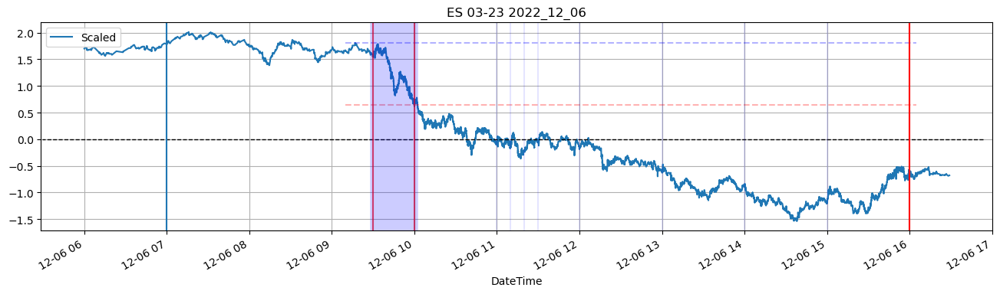

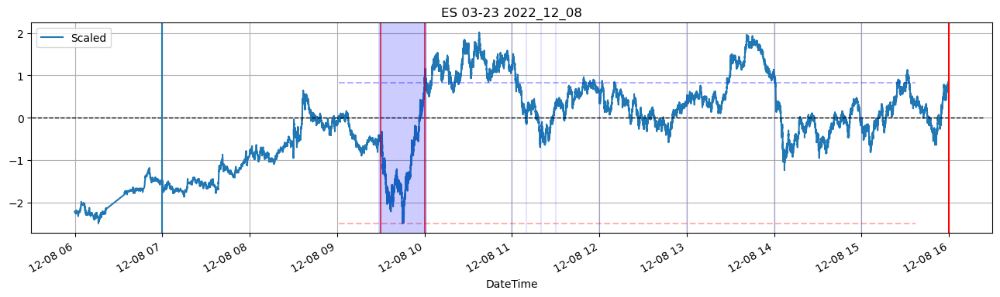

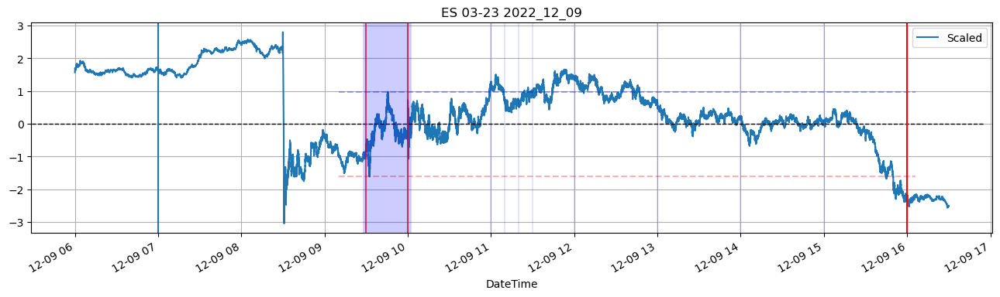

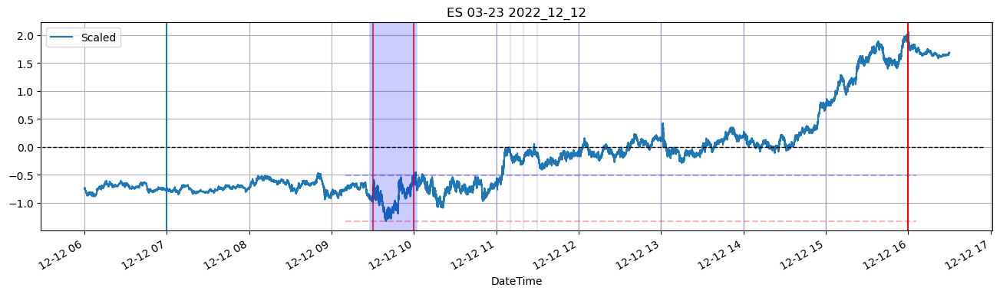

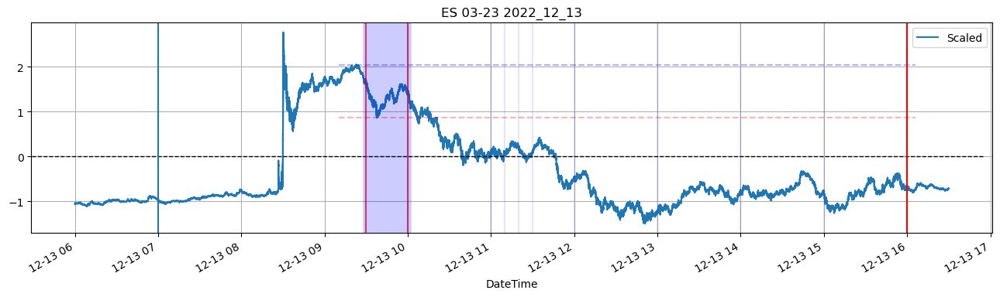

...

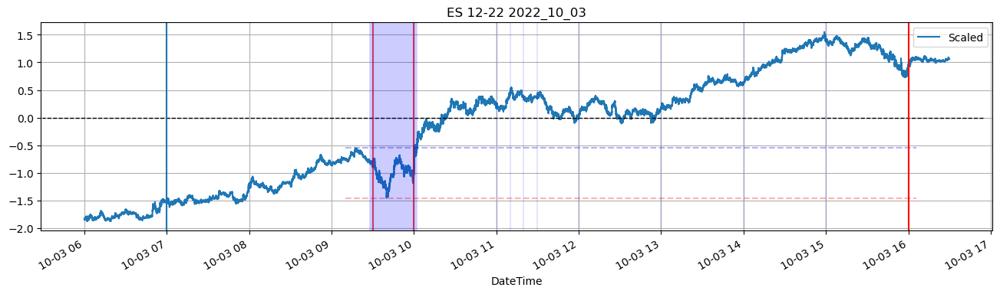

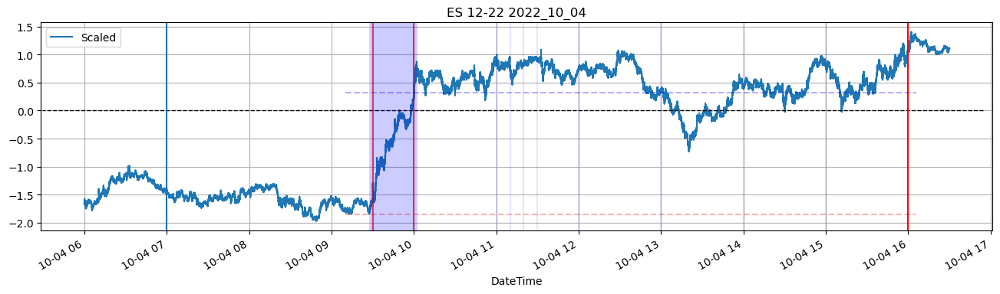

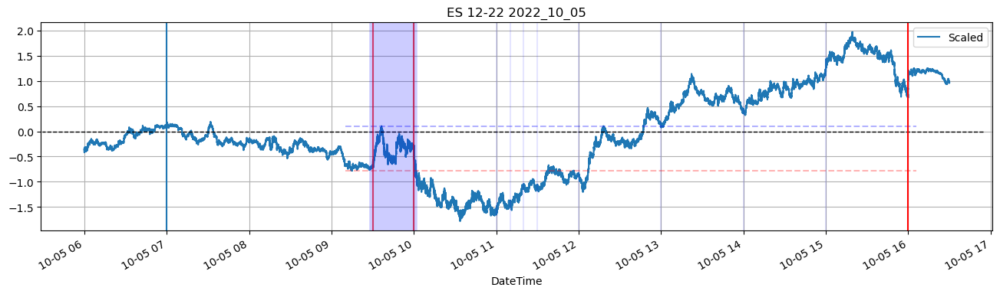

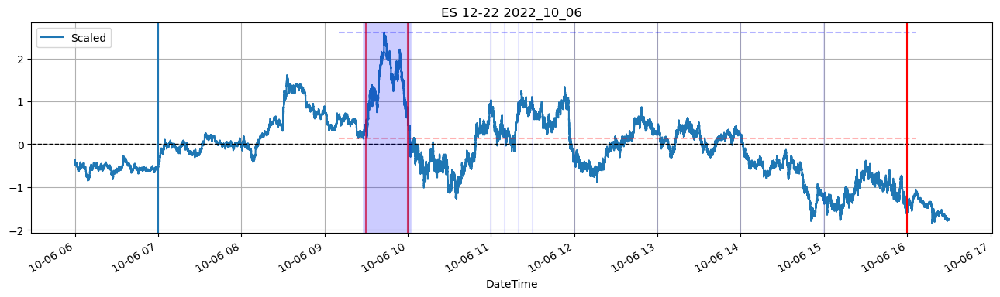

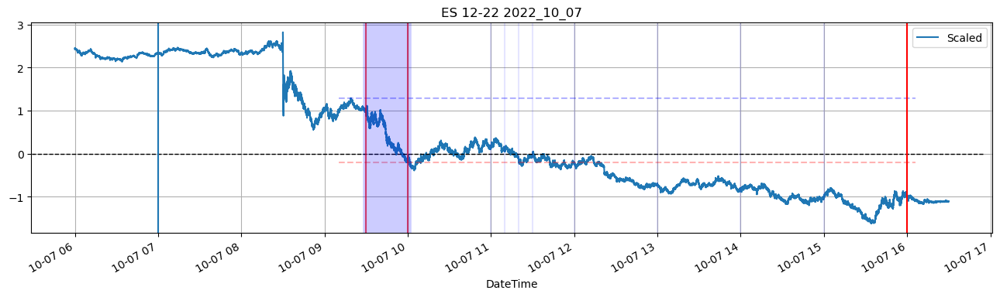

In [17]:
#  Loop through repo of 100 from 274 charts 
var_holder = {}               
for i in range(1, 100):        
    x = repo[i].replace('C:\BidAskRepo\\', '').replace('Globex_', '').replace('.csv','').strip()
    var_holder[x] = x
    # print('x is: ', x)
    var_holder[x] = from_Tick(repo[i], '1S', True)
    var_holder[x].to_csv('C:\\Repo1\\' + x + '.csv')   

Shape:  (1407899, 6)
Shape:  (1729064, 6)
Shape:  (1383560, 6)
Shape:  (2364867, 6)
Shape:  (1881653, 6)
Shape:  (1297689, 6)
Shape:  (1906767, 6)
Shape:  (1630138, 6)
Shape:  (1620146, 6)
Shape:  (1877127, 6)
Shape:  (1462400, 6)
Shape:  (1224525, 6)
Shape:  (1465043, 6)
Shape:  (1603888, 6)
Shape:  (1324391, 6)
Shape:  (1259821, 6)
Shape:  (1293956, 6)
Shape:  (1622913, 6)
Shape:  (1359918, 6)
Shape:  (1828127, 6)
Shape:  (1012838, 6)
Shape:  (1273386, 6)
Shape:  (1241954, 6)
Shape:  (1560508, 6)
Shape:  (1240777, 6)
Shape:  (1036154, 6)
Shape:  (1598225, 6)
Shape:  (998174, 6)
Shape:  (1035591, 6)
Shape:  (744190, 6)
Shape:  (714474, 6)
Shape:  (816396, 6)
Shape:  (82376, 6)
Shape:  (288592, 6)
Shape:  (859673, 6)
Shape:  (906159, 6)
Shape:  (1441819, 6)
Shape:  (1216237, 6)
Shape:  (1164483, 6)
Shape:  (953157, 6)
Shape:  (1138822, 6)
Shape:  (1158630, 6)
Shape:  (946032, 6)
Shape:  (729298, 6)
Shape:  (354859, 6)
Shape:  (456956, 6)
Shape:  (270829, 6)
Shape:  (215335, 6)
Shape:  

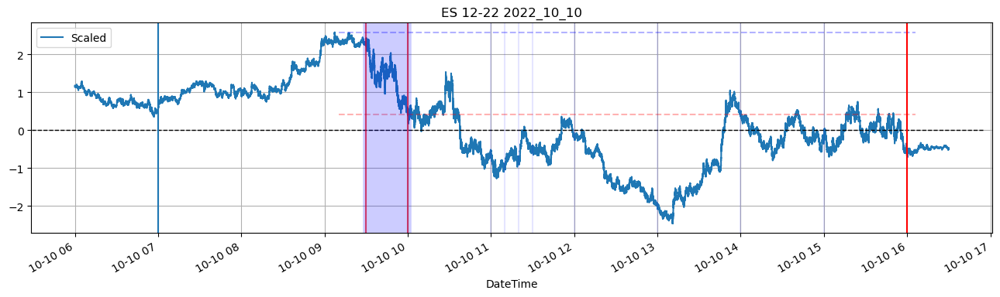

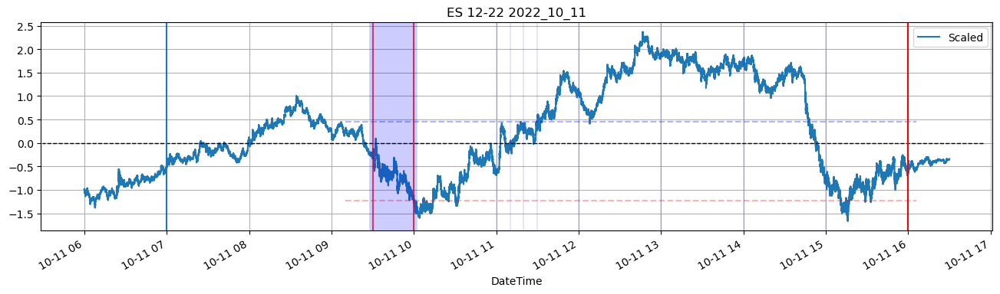

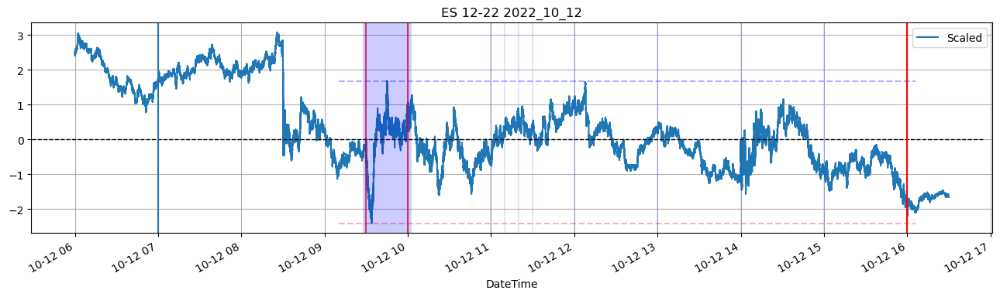

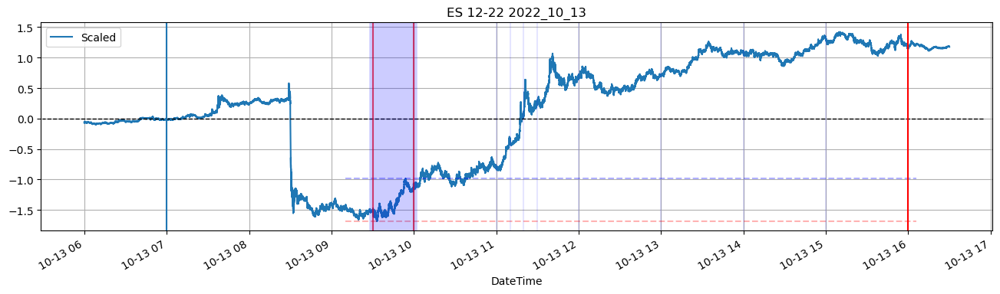

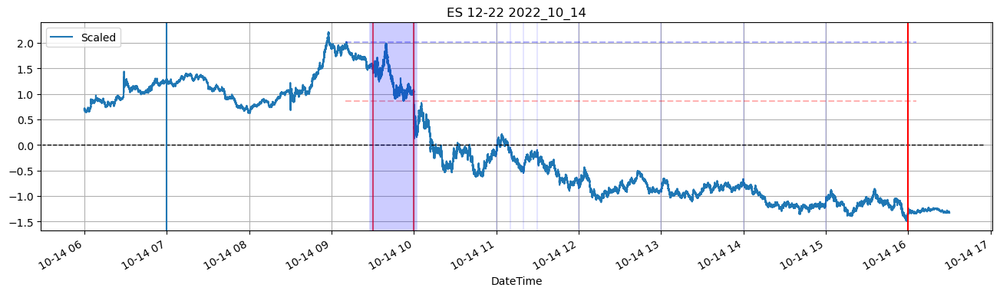

...

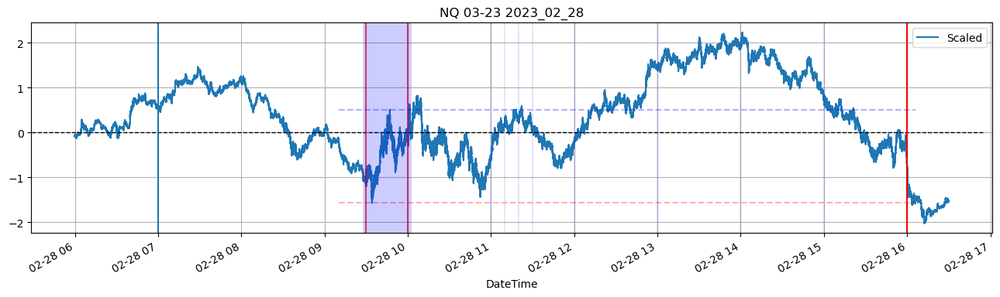

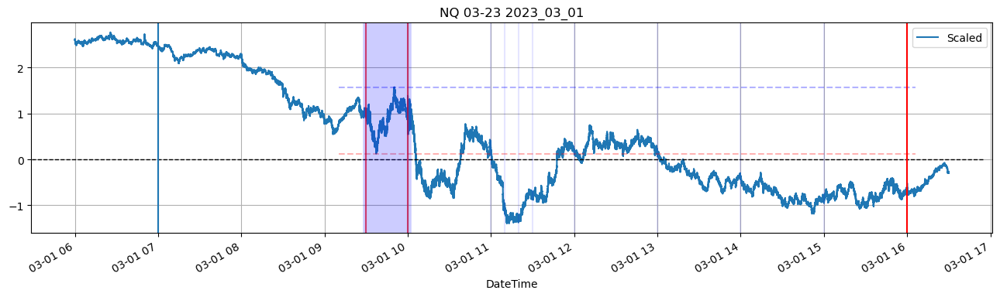

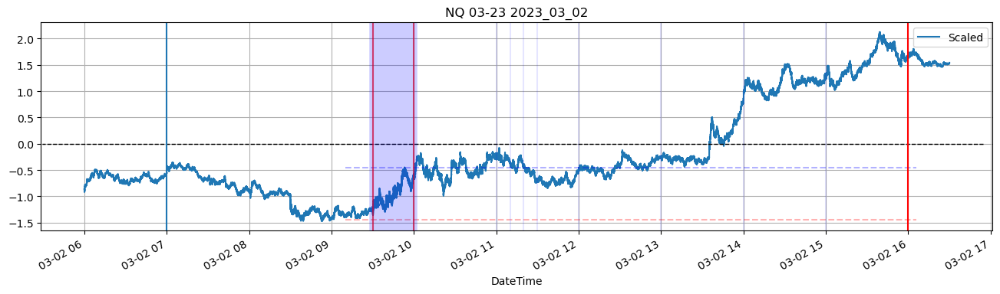

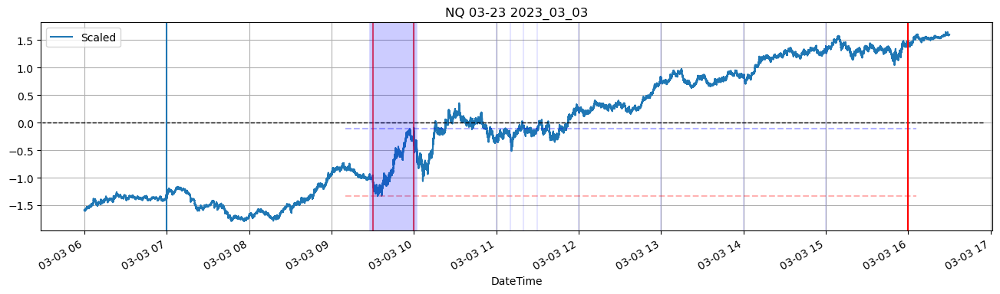

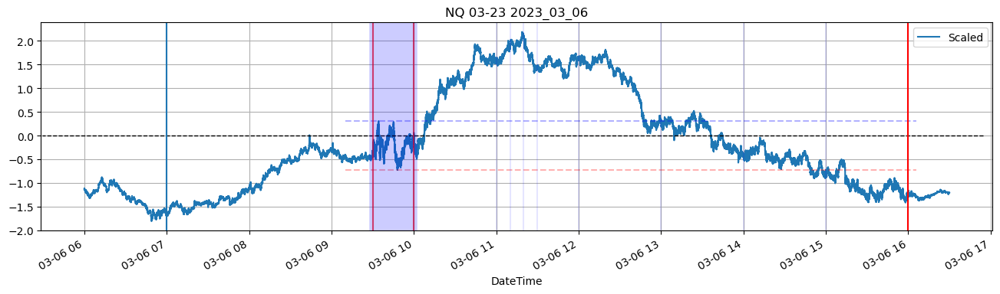

In [18]:
#  Loop through repo of another 100 sets from 274 charts (74 left)
var_holder = {}               
# for i in range(0, len(repo)): 
for i in range(100, 200):        
    x = repo[i].replace('C:\BidAskRepo\\', '').replace('Globex_', '').replace('.csv','').strip()
    var_holder[x] = x
    # print('x is: ', x)
    var_holder[x] = from_Tick(repo[i], '1S', True)
    var_holder[x].to_csv('C:\\Repo1\\' + x + '.csv')   

Shape:  (610395, 6)
Shape:  (552850, 6)
Shape:  (719252, 6)
Shape:  (691258, 6)
Shape:  (577171, 6)
Shape:  (591689, 6)
Shape:  (709139, 6)
Shape:  (607072, 6)
Shape:  (620351, 6)
Shape:  (605727, 6)
Shape:  (498341, 6)
Shape:  (648079, 6)
Shape:  (747354, 6)
Shape:  (594169, 6)
Shape:  (494055, 6)
Shape:  (480472, 6)
Shape:  (496723, 6)
Shape:  (505915, 6)
Shape:  (504789, 6)
Shape:  (711663, 6)
Shape:  (786013, 6)
Shape:  (774749, 6)
Shape:  (805231, 6)
Shape:  (124156, 6)
Shape:  (640717, 6)
Shape:  (685510, 6)
Shape:  (634529, 6)
Shape:  (692599, 6)
Shape:  (648750, 6)
Shape:  (660103, 6)
Shape:  (735904, 6)
Shape:  (648961, 6)
Shape:  (954497, 6)
Shape:  (714972, 6)
Shape:  (566537, 6)
Shape:  (741087, 6)
Shape:  (671463, 6)
Shape:  (660971, 6)
Shape:  (722096, 6)
Shape:  (620083, 6)
Shape:  (608462, 6)
Shape:  (690330, 6)
Shape:  (692638, 6)
Shape:  (613197, 6)
Shape:  (544342, 6)
Shape:  (552287, 6)
Shape:  (704824, 6)
Shape:  (627353, 6)
Shape:  (762839, 6)
Shape:  (483886, 6)


IndexError: list index out of range

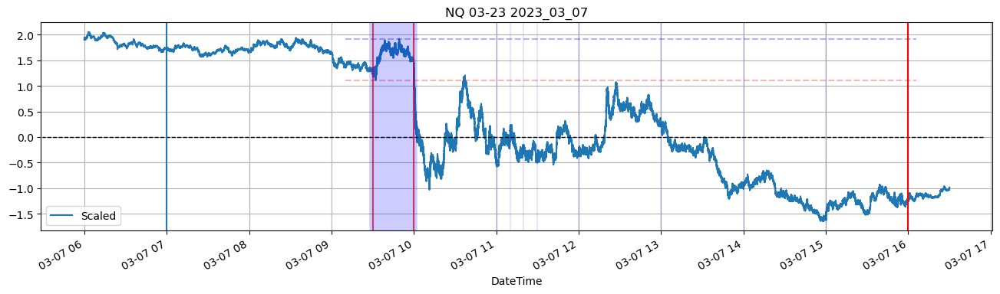

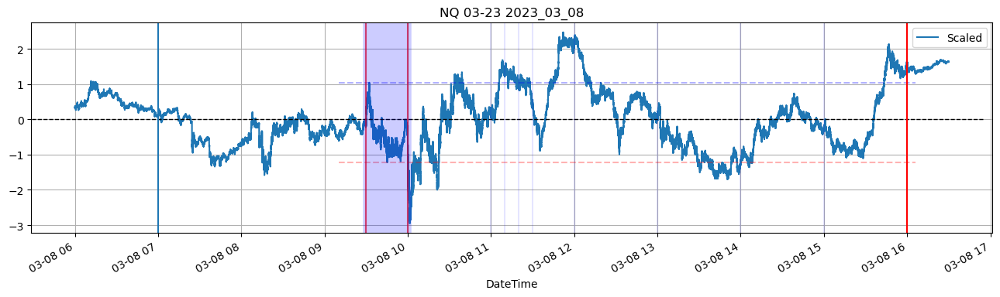

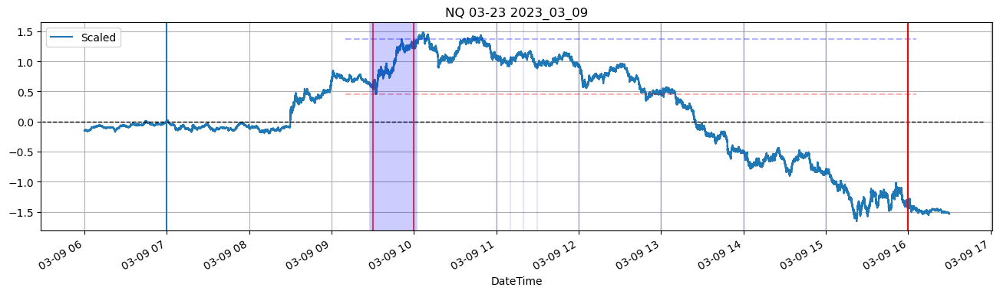

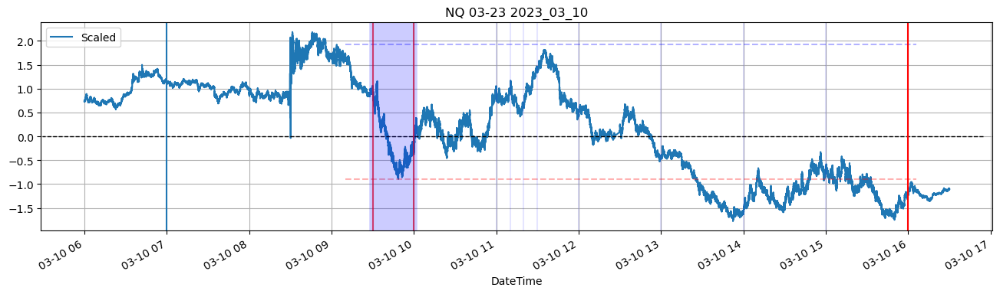

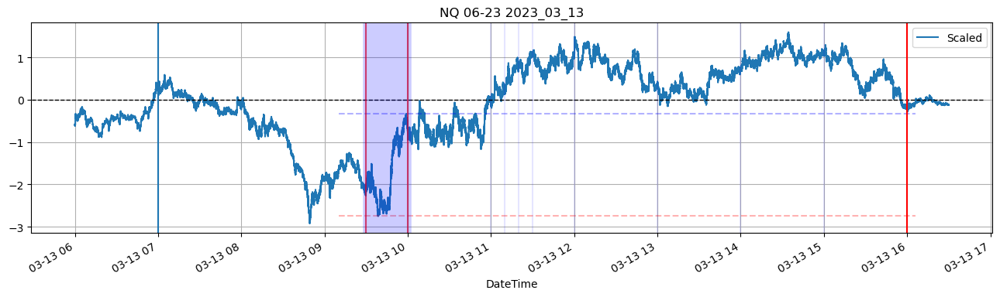

...

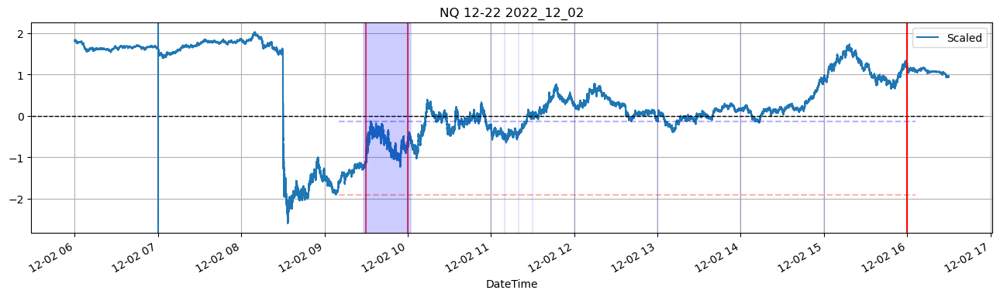

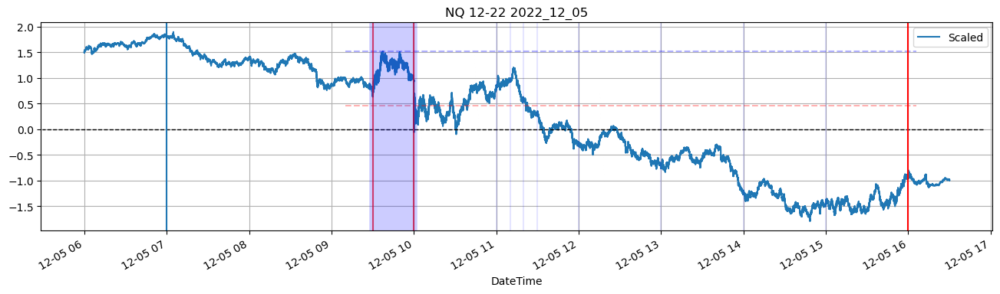

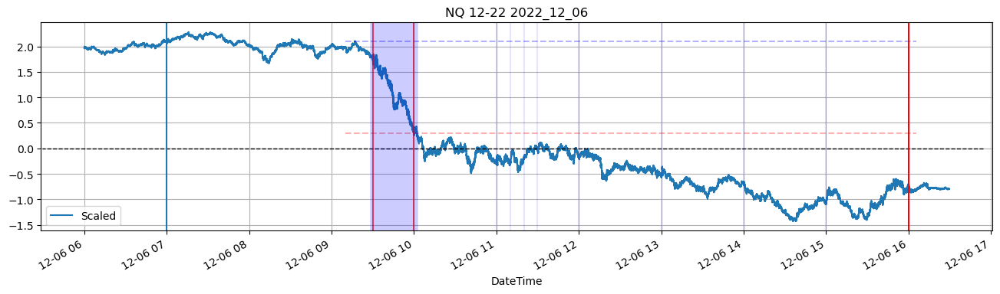

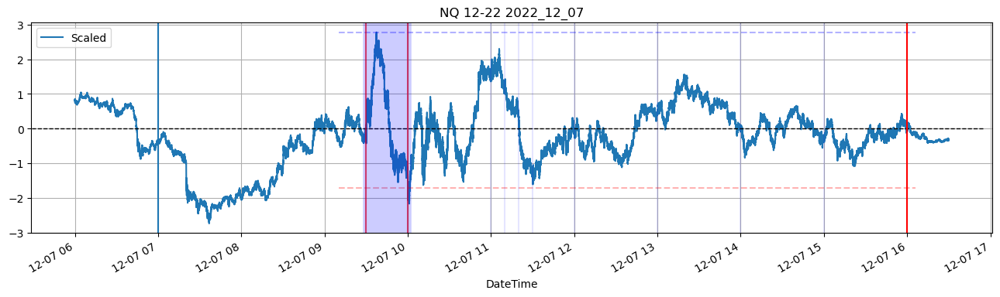

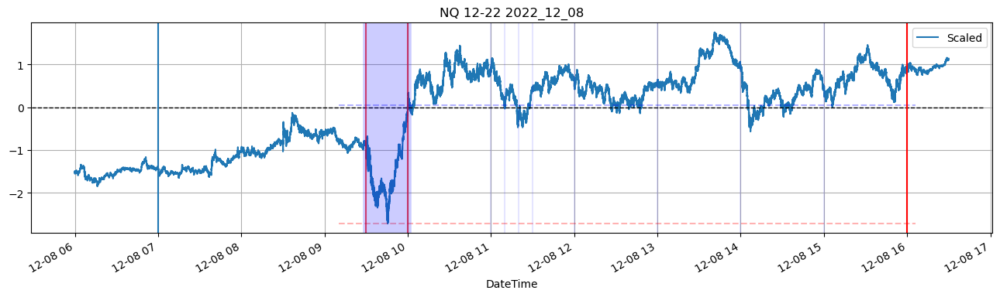

In [19]:
#  Loop through repo of last 74 sets from 274 sets
var_holder = {}               
# for i in range(0, len(repo)): 
for i in range(200, 274):        
    x = repo[i].replace('C:\BidAskRepo\\', '').replace('Globex_', '').replace('.csv','').strip()
    var_holder[x] = x
    # print('x is: ', x)
    var_holder[x] = from_Tick(repo[i], '1S', True)
    var_holder[x].to_csv('C:\\Repo1\\' + x + '.csv')  